# <p style="background-color:orange;font-family:newtimeroman;font-size:200%;color:white;text-align:center;border-radius:20px 20px;"><b>Online Retail Project</b></p>


## <p style="background-color:purple;font-family:newtimeroman;font-size:100%;color:white;text-align:center;border-radius:10px 10px;"><b>BY SAHAN</b></p>



# Online Retail Project

This notebook provides a structured approach to handling data cleaning, exploratory data analysis (EDA), and data visualization tasks using the provided Online Retail dataset.

Each step will cover various aspects of cleaning, analyzing, and visualizing the dataset.


# Dataset Description 

**InvoiceNo:**  
Unique identifier for each transaction (similar to an invoice number).

**StockCode:**  
Product identifier for the item being sold (e.g., SKU code).

**Description:**  
Description of the product (e.g., "White Mug", "Headphones").

**Quantity:**  
Number of units of the product purchased. A negative value suggests returns.

**InvoiceDate:**  
Date and time when the order was placed.

**UnitPrice:**  
Price per unit of the product.

**CustomerID:**  
Unique identifier for the customer placing the order.

**Country:**  
The customer's country.

**Discount:**  
Discount applied to the order as a fraction of the price.

**PaymentMethod:**  
Payment method used for the order (e.g., "Credit Card", "Bank Transfer").

**ShippingCost:**  
Cost incurred for shipping the product.

**Category:**  
Product category (e.g., "Apparel", "Electronics").

**SalesChannel:**  
Indicates whether the purchase was made online or in-store.

**ReturnStatus:**  
Whether the item was returned or not.

**ShipmentProvider:**  
Company responsible for delivering the product (e.g., "FedEx", "UPS").

**WarehouseLocation:**  
The warehouse from where the product was shipped (e.g., "London", "Berlin").

**OrderPriority:**  
Priority level assigned to the order (e.g., "Medium", "High").

## Step 1: Import Libraries, Loading the Dataset and Initial Exploration

In [1]:
# Load the dataset 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import missingno as msno
import plotly.express as px


plt.rcParams["figure.figsize"] = (6,4)

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Display first few rows
# Check the structure of the dataset.
# Inspect the data types and missing values using df.info()
# Get basic statistics for numerical columns with df.describe()
# and more..

In [2]:
df = pd.read_csv("online_retail_dataset.csv")

In [3]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Discount,PaymentMethod,ShippingCost,Category,SalesChannel,ReturnStatus,ShipmentProvider,WarehouseLocation,OrderPriority
0,221958,SKU_1964,White Mug,38,2020-01-01 00:00,1.71,37039.0,Australia,0.470000,Bank Transfer,10.79,Apparel,In-store,Not Returned,UPS,London,Medium
1,771155,SKU_1241,White Mug,18,2020-01-01 01:00,41.25,19144.0,Spain,0.190000,paypall,9.51,Electronics,Online,Not Returned,UPS,Rome,Medium
2,231932,SKU_1501,Headphones,49,2020-01-01 02:00,29.11,50472.0,Germany,0.350000,Bank Transfer,23.03,Electronics,Online,Returned,UPS,Berlin,High
3,465838,SKU_1760,Desk Lamp,14,2020-01-01 03:00,76.68,96586.0,Netherlands,0.140000,paypall,11.08,Accessories,Online,Not Returned,Royal Mail,Rome,Low
4,359178,SKU_1386,USB Cable,-30,2020-01-01 04:00,-68.11,NaN,United Kingdom,1.501433,Bank Transfer,NaN,Electronics,In-store,Not Returned,FedEx,NaN,Medium


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49782 entries, 0 to 49781
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   InvoiceNo          49782 non-null  int64  
 1   StockCode          49782 non-null  object 
 2   Description        49782 non-null  object 
 3   Quantity           49782 non-null  int64  
 4   InvoiceDate        49782 non-null  object 
 5   UnitPrice          49782 non-null  float64
 6   CustomerID         44804 non-null  float64
 7   Country            49782 non-null  object 
 8   Discount           49782 non-null  float64
 9   PaymentMethod      49782 non-null  object 
 10  ShippingCost       47293 non-null  float64
 11  Category           49782 non-null  object 
 12  SalesChannel       49782 non-null  object 
 13  ReturnStatus       49782 non-null  object 
 14  ShipmentProvider   49782 non-null  object 
 15  WarehouseLocation  46297 non-null  object 
 16  OrderPriority      497

In [5]:
df["InvoiceDate"] = pd.to_datetime(df["InvoiceDate"]) 

In [6]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
InvoiceNo,49782.0,550681.239946,100005.0,324543.0,552244.0,776364.0,999997.0,260703.009944
Quantity,49782.0,22.372343,-50.0,11.0,23.0,37.0,49.0,17.917774
InvoiceDate,49782,2022-11-03 02:30:00,2020-01-01 00:00:00,2021-06-02 13:15:00,2022-11-03 02:30:00,2024-04-04 15:45:00,2025-09-05 05:00:00,NaN
UnitPrice,49782.0,47.537862,-99.98,23.5925,48.92,74.61,100.0,33.47951
CustomerID,44804.0,55032.871775,10001.0,32750.75,55165.0,77306.25,99998.0,25913.660157
Discount,49782.0,0.275748,0.0,0.13,0.26,0.38,1.999764,0.230077
ShippingCost,47293.0,17.494529,5.0,11.22,17.5,23.72,30.0,7.220557


In [7]:
# UnitPrice is contain negative values. Remove that values from dataset 

In [8]:
negative_value_ratio =  round(df[df["UnitPrice"] <0].shape[0] / len(df)* 100, 2) 
print(f"%{negative_value_ratio}") 

%3.0


In [9]:
df = df[df["UnitPrice"] >= 0]

In [10]:
negative_value_ratio =  round(df[df["UnitPrice"] <0].shape[0] / len(df)* 100, 2) 
print(f"%{negative_value_ratio}") 

%0.0


In [11]:
def find_cardinality(df):
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    unique_counts = df[categorical_cols].nunique()
    for col, count in unique_counts.items():
        print(f"{col}: {count}")
find_cardinality(df)

StockCode: 1000
Description: 11
Country: 12
PaymentMethod: 3
Category: 5
SalesChannel: 2
ReturnStatus: 2
ShipmentProvider: 4
WarehouseLocation: 5
OrderPriority: 3


In [12]:
def grab_column_names(df, cardinality_threshold=20):
    """    
    Identifies and categorizes columns in a Pandas DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame.
        cardinality_threshold (int, optional): Maximum unique values 
            for a column to be considered cardinal. Defaults to 20. 

    Returns:
        tuple: A tuple containing lists of:
            - numeric_columns (list): List of numeric column names.
            - categorical_columns (list): List of categorical column names.
            - cardinal_columns (list): List of cardinal column names.
    """

    # Sayısal sütunları tanımla
    numeric_columns = df.select_dtypes(include=["number"]).columns.tolist()
    
    # Kategorik sütunları tanımla
    categorical_columns = df.select_dtypes(include=["object", "category"]).columns.tolist() 
    
    # Cardinal sütunları tanımla, yalnızca threshold'tan büyük olanları al
    cardinal_columns = [col for col in categorical_columns if df[col].nunique() > cardinality_threshold]
    
    return numeric_columns, categorical_columns, cardinal_columns 
numeric_columns, categorical_columns, cardinal_columns = grab_column_names(df) 

In [13]:
numeric_columns

['InvoiceNo',
 'Quantity',
 'UnitPrice',
 'CustomerID',
 'Discount',
 'ShippingCost']

In [14]:
numeric_columns.remove("InvoiceNo")
numeric_columns.remove("CustomerID")     

cardinal_columns.append("InvoiceNo")
cardinal_columns.append("CustomerID")

In [15]:
numeric_columns

['Quantity', 'UnitPrice', 'Discount', 'ShippingCost']

In [16]:
cardinal_columns

['StockCode', 'InvoiceNo', 'CustomerID']

In [17]:
categorical_columns

['StockCode',
 'Description',
 'Country',
 'PaymentMethod',
 'Category',
 'SalesChannel',
 'ReturnStatus',
 'ShipmentProvider',
 'WarehouseLocation',
 'OrderPriority']

In [18]:
categorical_columns.remove("StockCode") 


In [19]:
categorical_columns

['Description',
 'Country',
 'PaymentMethod',
 'Category',
 'SalesChannel',
 'ReturnStatus',
 'ShipmentProvider',
 'WarehouseLocation',
 'OrderPriority']

## Step2: Numerical Column Analysis 

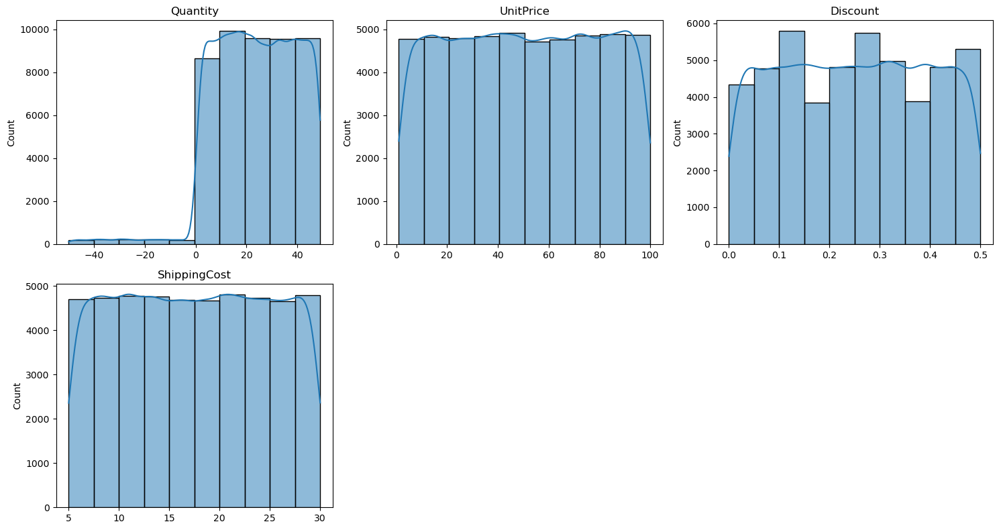

In [20]:
def plot_histograms(df, columns, rows=2, cols=3):
    """
    Plot histograms for specified columns in a dataframe.

    Args:
    df (pandas.DataFrame): The dataframe containing the data.
    columns (list): List of column names to plot.
    rows (int): Number of rows in the plot grid. Default is 2.
    cols (int): Number of columns in the plot grid. Default is 3.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
    axes = axes.flatten()  # Flatten axes array for easy indexing

    for i, col in enumerate(columns):
        if i < len(axes):  # Check if we have enough subplots
            sns.histplot(df[col], kde=True, ax=axes[i], bins=10)
            axes[i].set_title(col)
            axes[i].set_xlabel('')  # Remove x-label as it's redundant with title

    # Remove unused subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

plot_histograms(df, numeric_columns, rows=2, cols=3)

## Step2: Categorical Columns Analysis 


Analysis for column: Description
##################################################
Unique values count: 11
Unique values: ['White Mug' 'Headphones' 'Desk Lamp' 'Office Chair' 'USB Cable'
 'Notebook' 'Wireless Mouse' 'Blue Pen' 'Wall Clock' 'T-shirt' 'Backpack']
Value counts:
Description
Wall Clock        4451
USB Cable         4443
Backpack          4441
Desk Lamp         4414
White Mug         4406
Headphones        4400
Office Chair      4396
Blue Pen          4363
T-shirt           4347
Notebook          4321
Wireless Mouse    4307
Name: count, dtype: int64


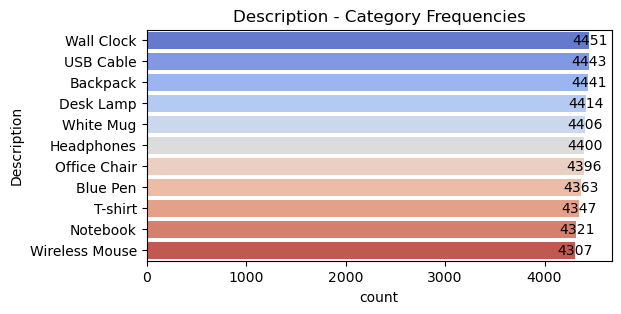

##################################################

Analysis for column: Country
##################################################
Unique values count: 12
Unique values: ['Australia' 'Spain' 'Germany' 'Netherlands' 'Sweden' 'Belgium' 'Norway'
 'Italy' 'United Kingdom' 'Portugal' 'France' 'United States']
Value counts:
Country
France            4105
Sweden            4092
United Kingdom    4054
Portugal          4050
Germany           4045
Belgium           4045
Norway            4036
Netherlands       4030
Australia         3988
Spain             3979
United States     3945
Italy             3920
Name: count, dtype: int64


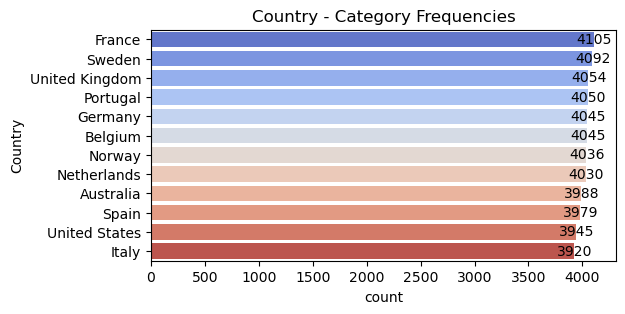

##################################################

Analysis for column: PaymentMethod
##################################################
Unique values count: 3
Unique values: ['Bank Transfer' 'paypall' 'Credit Card']
Value counts:
PaymentMethod
Bank Transfer    16268
Credit Card      16056
paypall          15965
Name: count, dtype: int64


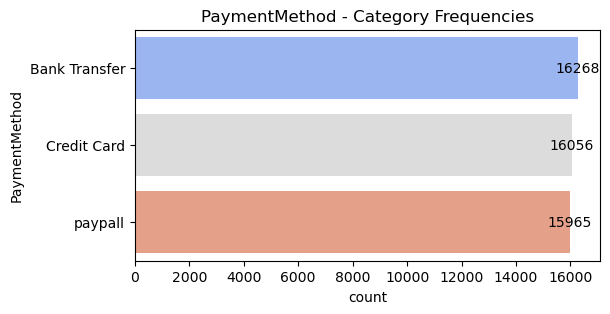

##################################################

Analysis for column: Category
##################################################
Unique values count: 5
Unique values: ['Apparel' 'Electronics' 'Accessories' 'Stationery' 'Furniture']
Value counts:
Category
Furniture      9769
Accessories    9651
Stationery     9647
Electronics    9638
Apparel        9584
Name: count, dtype: int64


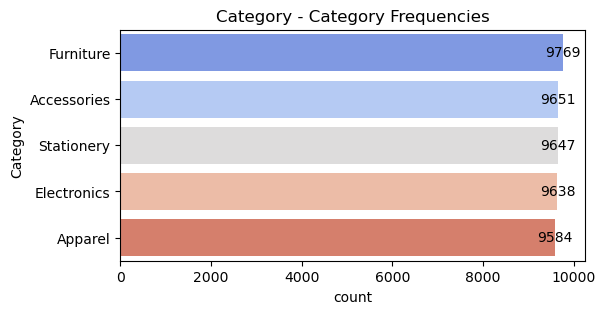

##################################################

Analysis for column: SalesChannel
##################################################
Unique values count: 2
Unique values: ['In-store' 'Online']
Value counts:
SalesChannel
Online      24281
In-store    24008
Name: count, dtype: int64


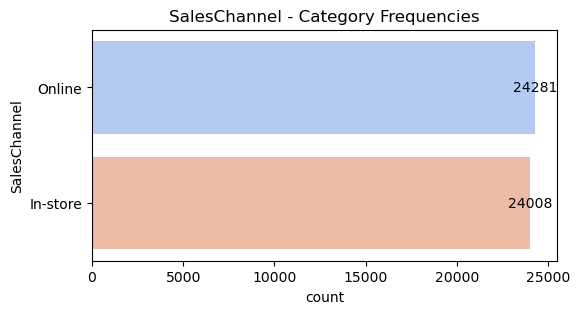

##################################################

Analysis for column: ReturnStatus
##################################################
Unique values count: 2
Unique values: ['Not Returned' 'Returned']
Value counts:
ReturnStatus
Not Returned    43545
Returned         4744
Name: count, dtype: int64


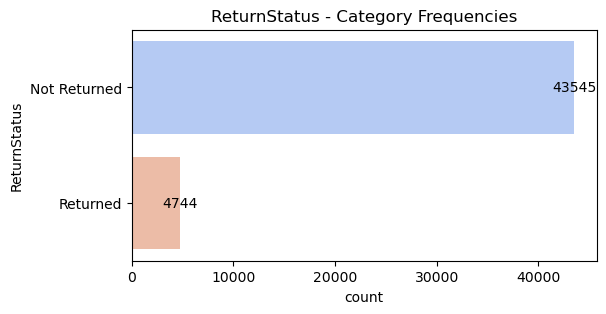

##################################################

Analysis for column: ShipmentProvider
##################################################
Unique values count: 4
Unique values: ['UPS' 'Royal Mail' 'DHL' 'FedEx']
Value counts:
ShipmentProvider
FedEx         12154
Royal Mail    12059
UPS           12040
DHL           12036
Name: count, dtype: int64


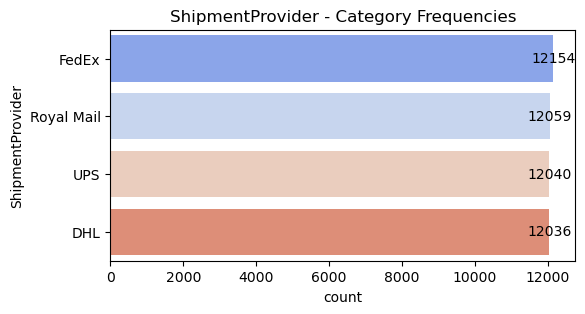

##################################################

Analysis for column: WarehouseLocation
##################################################
Unique values count: 5
Unique values: ['London' 'Rome' 'Berlin' 'Amsterdam' 'Paris' nan]
Value counts:
WarehouseLocation
Amsterdam    9458
London       9230
Rome         9226
Berlin       9210
Paris        9173
Name: count, dtype: int64


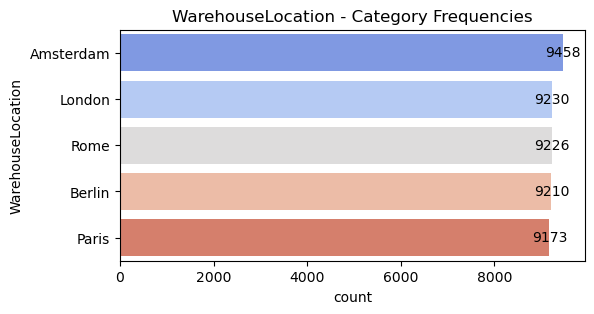

##################################################

Analysis for column: OrderPriority
##################################################
Unique values count: 3
Unique values: ['Medium' 'High' 'Low']
Value counts:
OrderPriority
Medium    16150
High      16102
Low       16037
Name: count, dtype: int64


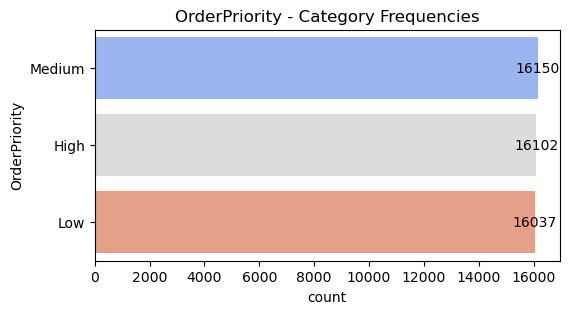

##################################################


In [21]:
def analyze_categorical_columns(df, categorical_columns, plot=True):
    """
    Analyze categorical columns in a DataFrame.

    Args:
        df (pandas.DataFrame): The input DataFrame.
        categorical_columns (list): List of categorical column names.
        plot (bool, optional): Whether to display plots. Defaults to True.
    """

    for col in categorical_columns:
        print(f"\nAnalysis for column: {col}")
        print("##################################################")
        print(f"Unique values count: {df[col].nunique()}")
        print(f"Unique values: {df[col].unique()}")
        print(f"Value counts:\n{df[col].value_counts()}")

        if plot:
            plt.figure(figsize=(6, 3))
            # Using seaborn's countplot for better visualization
            ax = sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="coolwarm")

            # Adding the count numbers on top of the bars
            for p in ax.patches:
                ax.annotate(f'{p.get_width():.0f}', (p.get_width() + 5, p.get_y() + p.get_height() / 2),
                            ha='center', va='center')

            plt.title(f'{col} - Category Frequencies')
            plt.show()
        print("##################################################")

analyze_categorical_columns(df, categorical_columns, True) 

## Step 3: Analyzing and Handling Missing Values

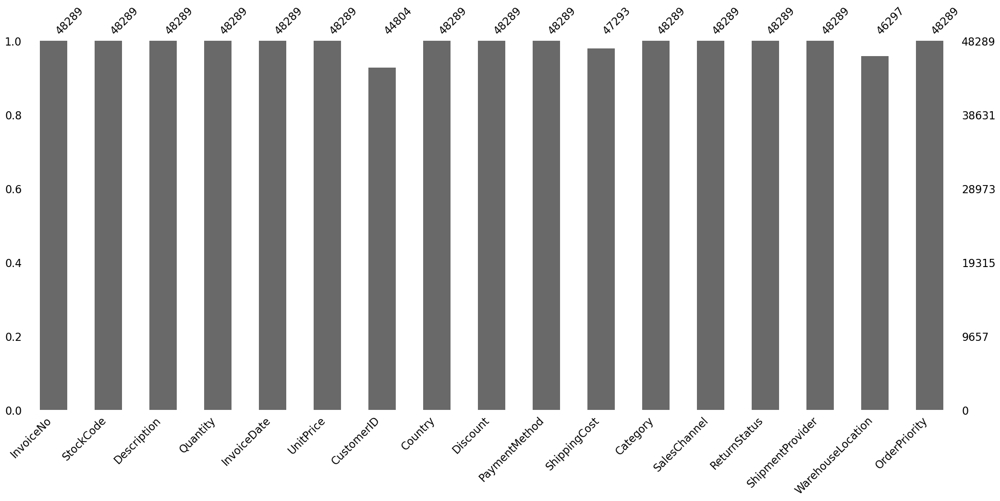

In [22]:
msno.bar(df);

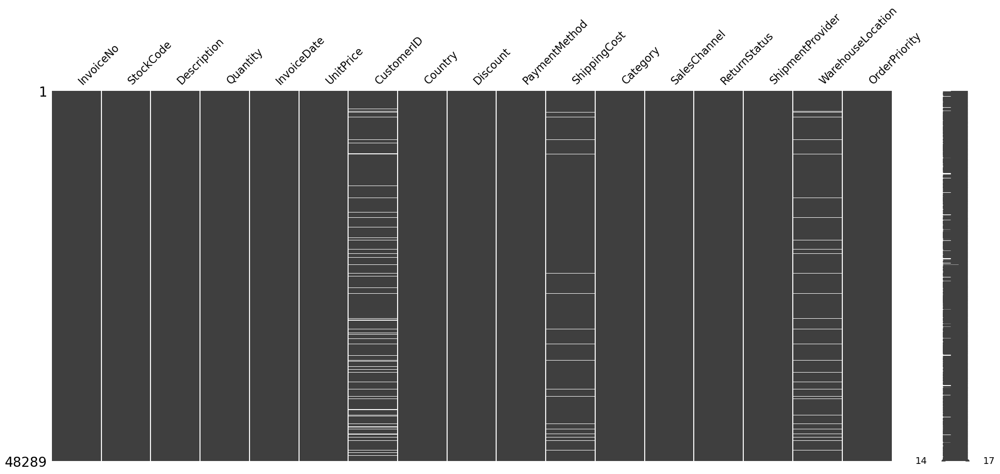

In [23]:
msno.matrix(df);

In [24]:
df.isnull().mean() * 100 

InvoiceNo            0.000000
StockCode            0.000000
Description          0.000000
Quantity             0.000000
InvoiceDate          0.000000
UnitPrice            0.000000
CustomerID           7.216965
Country              0.000000
Discount             0.000000
PaymentMethod        0.000000
ShippingCost         2.062582
Category             0.000000
SalesChannel         0.000000
ReturnStatus         0.000000
ShipmentProvider     0.000000
WarehouseLocation    4.125163
OrderPriority        0.000000
dtype: float64

In [25]:
df["CustomerID"]  = df["CustomerID"].fillna("Unknown") 

In [26]:
df["CustomerID"].nunique()

35390

In [27]:
numeric_df = df[numeric_columns]
numeric_df.corr()

,Quantity,UnitPrice,Discount,ShippingCost
Quantity,1.000000,-0.002715,-0.000781,-0.004086
UnitPrice,-0.002715,1.000000,-0.005367,0.003112
Discount,-0.000781,-0.005367,1.000000,-0.001282
ShippingCost,-0.004086,0.003112,-0.001282,1.000000


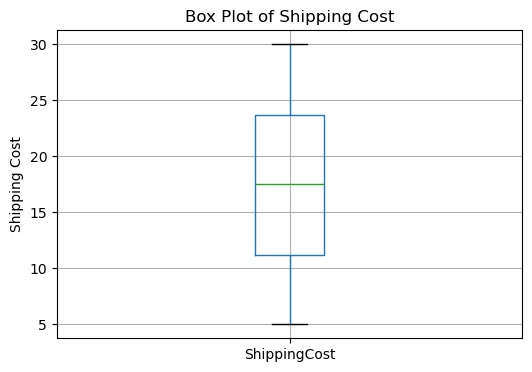

In [28]:
plt.figure(figsize=(6, 4))
df.boxplot(column=['ShippingCost'])
plt.title('Box Plot of Shipping Cost')
plt.ylabel('Shipping Cost')
plt.show()

In [29]:
df["ShippingCost"] = df["ShippingCost"].fillna(df["ShippingCost"].median()) 

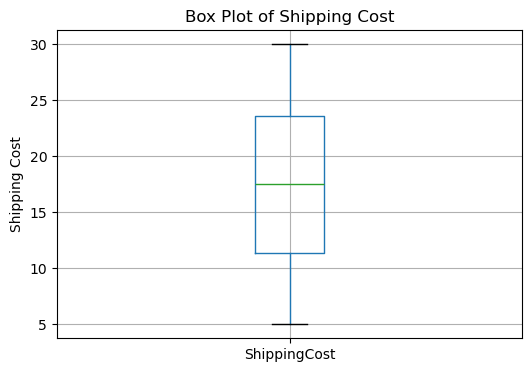

In [30]:
plt.figure(figsize=(6, 4))
df.boxplot(column=['ShippingCost'])
plt.title('Box Plot of Shipping Cost')
plt.ylabel('Shipping Cost')
plt.show()

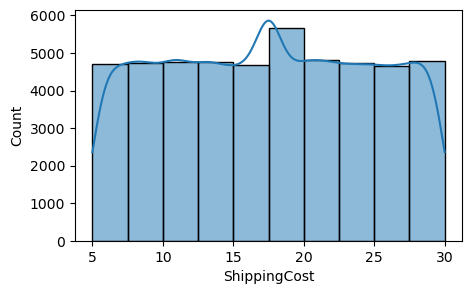

In [31]:
plt.figure(figsize=(5,3))
sns.histplot(df["ShippingCost"], kde=True, bins=10);


## Step 4: Detecting and Handling Outliers

In [32]:
import plotly.graph_objs as go
import plotly.subplots as sp

def plot_all_boxplots(df, num_col):
    # Create subplots: 1 row and as many columns as there are numeric columns
    fig = sp.make_subplots(rows=1, cols=len(num_col), 
                           subplot_titles=num_col, 
                           horizontal_spacing=0.1)  # Adjust spacing between subplots

    # Loop over the numeric columns and create a box plot for each
    for i, col in enumerate(num_col):
        fig.add_trace(go.Box(y=df[col], name=col), row=1, col=i+1)
    
    # Update layout for better visibility
    fig.update_layout(height=500, width=300 * len(num_col), title_text="Box Plots of Numeric Columns")
    
    # Show the plot
    fig.show()

# Usage example:

plot_all_boxplots(df, numeric_columns)

In [33]:
def outlier_bounds(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

def outlier_ratio(dataframe, column):
    lower_bound, upper_bound = outlier_bounds(dataframe, column)
    outliers = dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)]
    return round((len(outliers) / len(dataframe)) * 100,2)
for col in numeric_columns:
    print(f"{col} : {outlier_ratio(df, col)}")

Quantity : 1.07
UnitPrice : 0.0
Discount : 0.0
ShippingCost : 0.0


In [34]:
def remove_outliers(dataframe, column):
    lower_bound, upper_bound = outlier_bounds(dataframe, column)
    dataframe.drop(dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)].index, inplace=True)

remove_outliers(df, "Quantity")    

In [35]:
for col in numeric_columns:
    print(f"{col} : {outlier_ratio(df, col)}")

Quantity : 0.0
UnitPrice : 0.0
Discount : 0.0
ShippingCost : 0.0


## Step 5: Feature Engineering

In [36]:
# Create new feature 'TotalCost'
df["TotalCost"] = (df["Quantity"] * df["UnitPrice"] * (1-df["Discount"]) + df["ShippingCost"])
# Extracting Day of the Week from 'InvoiceDate'
df['Revenue'] = df['Quantity'] * df['UnitPrice'] * (1 - df['Discount'])
df['TotalSales'] = df['Quantity'] * df['UnitPrice'] 
# Extracting Month from 'InvoiceDate'
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')
df["Day"] = df["InvoiceDate"].dt.day_name()
df["Month"] = df["InvoiceDate"].dt.month_name()

In [37]:
numeric_columns, categorical_columns, cardinal_columns = grab_column_names(df)

In [38]:
numeric_columns

['InvoiceNo',
 'Quantity',
 'UnitPrice',
 'Discount',
 'ShippingCost',
 'TotalCost',
 'Revenue',
 'TotalSales']

### Outliers Control

In [39]:
import plotly.graph_objs as go
import plotly.subplots as sp

def plot_all_boxplots_vertically(df, num_col):
    
    fig = sp.make_subplots(rows=len(num_col), cols=1,
                           subplot_titles=num_col, 
                           vertical_spacing=0.08)  

    for i, col in enumerate(num_col):
        fig.add_trace(go.Box(y=df[col], name=col), row=i+1, col=1)

    fig.update_layout(height=250 * len(num_col), width=800, title_text="Sayısal Sütunların Kutu Grafikleri")

    fig.show()




plot_all_boxplots_vertically(df, numeric_columns)

In [40]:
for col in numeric_columns:
    print(f"{col} : {outlier_ratio(df, col)}")

InvoiceNo : 0.0
Quantity : 0.0
UnitPrice : 0.0
Discount : 0.0
ShippingCost : 0.0
TotalCost : 2.56
Revenue : 2.55
TotalSales : 1.21


In [41]:
remove_outliers(df, "Revenue") 
remove_outliers(df, "TotalCost") 
remove_outliers(df, "Quantity") 
remove_outliers(df, "TotalSales") 

In [42]:
for col in numeric_columns:
    print(f"{col} : {outlier_ratio(df, col)}")

InvoiceNo : 0.0
Quantity : 0.0
UnitPrice : 0.0
Discount : 0.0
ShippingCost : 0.0
TotalCost : 0.5
Revenue : 0.5
TotalSales : 0.23


## Step7: Saving clean dataframe

In [43]:
df.to_csv("cleaned_data.csv", index=False) 

In [44]:
df2 = pd.read_csv("cleaned_data.csv") 

In [45]:
df2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Discount,PaymentMethod,ShippingCost,Category,SalesChannel,ReturnStatus,ShipmentProvider,WarehouseLocation,OrderPriority,TotalCost,Revenue,TotalSales,Day,Month
0,221958,SKU_1964,White Mug,38,2020-01-01 00:00:00,1.71,37039.0,Australia,0.47,Bank Transfer,10.79,Apparel,In-store,Not Returned,UPS,London,Medium,45.2294,34.4394,64.98,Wednesday,January
1,771155,SKU_1241,White Mug,18,2020-01-01 01:00:00,41.25,19144.0,Spain,0.19,paypall,9.51,Electronics,Online,Not Returned,UPS,Rome,Medium,610.9350,601.4250,742.50,Wednesday,January
2,231932,SKU_1501,Headphones,49,2020-01-01 02:00:00,29.11,50472.0,Germany,0.35,Bank Transfer,23.03,Electronics,Online,Returned,UPS,Berlin,High,950.1835,927.1535,1426.39,Wednesday,January
3,465838,SKU_1760,Desk Lamp,14,2020-01-01 03:00:00,76.68,96586.0,Netherlands,0.14,paypall,11.08,Accessories,Online,Not Returned,Royal Mail,Rome,Low,934.3072,923.2272,1073.52,Wednesday,January
4,744167,SKU_1006,Office Chair,47,2020-01-01 05:00:00,70.16,53887.0,Sweden,0.48,Credit Card,13.98,Electronics,Online,Not Returned,DHL,London,Medium,1728.6904,1714.7104,3297.52,Wednesday,January


## Step 8: Data Visualization

### Sales Distribution by Country

In [46]:
# Bar chart for total sales by country


sales_by_country = df.groupby('Country')['TotalSales'].sum().sort_values(ascending=False).reset_index()

fig = px.bar(sales_by_country, 
             x='Country', 
             y='TotalSales',
             title='Total Sales According to the Countries',
             labels={'TotalSales': 'Toplam Satışlar', 'Country': 'Ülke'},
             color='Country',
             )
fig.show()

### Payment Method Usage

In [47]:
# Pie chart for payment methods
payment_method_counts = df['PaymentMethod'].value_counts().reset_index()
payment_method_counts.columns = ['PaymentMethod', 'Count']

fig = px.pie(payment_method_counts, 
             names='PaymentMethod', 
             values='Count', 
             title='Distribution of Payment Methods')

fig.show()

### Seasonal Sales Trends

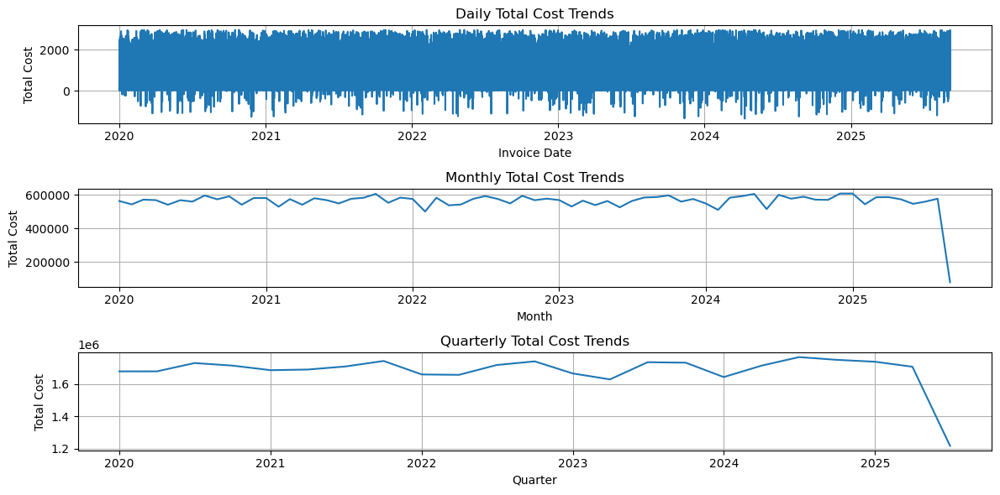

In [48]:
# Line chart for seasonal trends
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
# Set monthly and quarterly periods
df['Month'] = df['InvoiceDate'].dt.to_period('M')
df['Quarter'] = df['InvoiceDate'].dt.to_period('Q')

# Calculate sum of 'TotalCost' for each month and quarter
monthly_sums = df.groupby('Month')['TotalCost'].sum()
quarterly_sums = df.groupby('Quarter')['TotalCost'].sum()

# Plot daily, monthly and quarterly charts
plt.figure(figsize=(12, 6))

# Daily Plot
plt.subplot(3, 1, 1)  # 3 rows, 1 column of plots, this is the 1st plot
plt.plot(df['InvoiceDate'], df['TotalCost'])
plt.title('Daily Total Cost Trends')
plt.xlabel('Invoice Date')
plt.ylabel('Total Cost')
plt.grid(True)

# Monthly Plot
plt.subplot(3, 1, 2)  # 3 rows, 1 column of plots, this is the 2nd plot
plt.plot(monthly_sums.index.to_timestamp(), monthly_sums.values) 
plt.title('Monthly Total Cost Trends')
plt.xlabel('Month')
plt.ylabel('Total Cost')
plt.grid(True)

# Quarterly Plot
plt.subplot(3, 1, 3)  # 3 rows, 1 column of plots, this is the 3rd plot
plt.plot(quarterly_sums.index.to_timestamp(), quarterly_sums.values)
plt.title('Quarterly Total Cost Trends')
plt.xlabel('Quarter')
plt.ylabel('Total Cost')
plt.grid(True)

# Adjust spacing to prevent overlapping
plt.tight_layout() 
plt.show()

### Correlation Matrix

In [49]:
correlation_matrix = df.select_dtypes(include='number').corr()

fig = px.imshow(correlation_matrix, 
                text_auto=True, 
                color_continuous_scale='Blues', 
                title="Correlation Matrix of Numeric Columns",
                width=600,  
                height=600)

fig.show()

### Top Performing Products

In [50]:
# Bar chart for top 10 products by revenue
df.head(1)
top10 = df.groupby("Description")["Revenue"].sum().nlargest(10).reset_index()  
fig = px.bar(top10,
             x='Description',
             y='Revenue',
             title='Top 10 Products',
             labels={'Revenue': 'Total Income', 'Description': 'Product Name'},
             color='Revenue',
             color_continuous_scale='Viridis'
             )
fig.update_layout(xaxis_tickangle=-45)
fig.show()

### Customer Behavior Analysis

In [51]:
country_spending = df.groupby('Country')['Revenue'].mean().sort_values(ascending=False).reset_index()

# Create the bar chart
fig = px.bar(country_spending, 
             x='Country', 
             y='Revenue',
             title='Average Spending per Customer by Country',
             labels={'Revenue': 'Average Spending'},
             color='Country',           
             color_discrete_sequence=px.colors.qualitative.Pastel  # Use a color palette
            )

# Update layout for better presentation
fig.update_layout(xaxis_tickangle=-45,  # Rotate x-axis labels for readability 
                  xaxis_title="Country",
                  yaxis_title="Average Spending")

fig.show()

### Sales Channel Analysis

In [52]:
# Bar chart for sales by channel
sales_by_channel = df.groupby('SalesChannel')['TotalSales'].sum().reset_index()

fig = px.bar(sales_by_channel,
             x='SalesChannel',
             y='TotalSales',
             title='Total Sales by Sales Channel',
             labels={'TotalSales': 'Total Sales'},
             color='SalesChannel',
             color_discrete_sequence=px.colors.qualitative.Pastel
             )
fig.update_layout(width=500, height=400) 

fig.show()

# ANOVA

In [53]:
from scipy import stats 

In [54]:
def normalatiy_test(df, numeric_columns):
    for col in numeric_columns:
        results = stats.shapiro(df[col])
        print(f"{col}: {results}") 
        
normalatiy_test(df, numeric_columns)        

InvoiceNo: ShapiroResult(statistic=0.9543262388784113, pvalue=1.8281572427177794e-76)
Quantity: ShapiroResult(statistic=0.9691974454111493, pvalue=6.0189556062912656e-68)
UnitPrice: ShapiroResult(statistic=0.9590040030263671, pvalue=4.46217630810528e-74)
Discount: ShapiroResult(statistic=0.9564891798610972, pvalue=2.1817904252766103e-75)
ShippingCost: ShapiroResult(statistic=0.9559873641560888, pvalue=1.2161856248582354e-75)
TotalCost: ShapiroResult(statistic=0.9189598372061818, pvalue=8.759091941083005e-90)
Revenue: ShapiroResult(statistic=0.9188761217963127, pvalue=8.269731479924358e-90)
TotalSales: ShapiroResult(statistic=0.9242474731755601, pvalue=3.684971677973448e-88)


### Is there a significant difference in average sales amounts between different countries?


In [55]:
def kruskal_wallis(df, dependent, independent):
    groups = df[independent].unique()
    
    data_by_group = [df[df[independent] == group][dependent] for group in groups]
 
    h_statistic, p_value = stats.kruskal(*data_by_group)
    
    print(f"Kruskal-Wallis Test Results: {dependent} vs {independent}")
    print(f"p-değeri: {p_value:.4f}")
    if p_value < 0.05:
        print("We can say there is a difference between the means at the 95% confidence level.")
    else:
        print("We can say there is no difference between the means at the 95% confidence level.")

kruskal_wallis(df, "Revenue", "Country")

Kruskal-Wallis Test Results: Revenue vs Country
p-değeri: 0.0533
We can say there is no difference between the means at the 95% confidence level.


### Is there a difference in average sales between countries?

In [56]:
kruskal_wallis(df, "TotalSales","Country") 

Kruskal-Wallis Test Results: TotalSales vs Country
p-değeri: 0.0873
We can say there is no difference between the means at the 95% confidence level.


### Is there a difference in total sales between sales channels? 

In [57]:
kruskal_wallis(df, "TotalSales", "SalesChannel")

Kruskal-Wallis Test Results: TotalSales vs SalesChannel
p-değeri: 0.1338
We can say there is no difference between the means at the 95% confidence level.


### Effect of Discount Rates by Product Category
### We want to investigate the effect of discount rates applied between product categories

In [58]:
kruskal_wallis(df, "Discount", "Category")

Kruskal-Wallis Test Results: Discount vs Category
p-değeri: 0.2451
We can say there is no difference between the means at the 95% confidence level.


In [59]:
kruskal_wallis(df,"TotalSales", "PaymentMethod") 

Kruskal-Wallis Test Results: TotalSales vs PaymentMethod
p-değeri: 0.5528
We can say there is no difference between the means at the 95% confidence level.


## Step 7: Conclusion

This project involved a structured approach to data cleaning, exploratory data analysis (EDA), and data visualization using the provided Online Retail dataset. Here are the key findings:

**Discount Rates and Product Categories:** Analysis showed no statistically significant difference in discount rates across product categories (p-value: 0.2451), suggesting that products in various categories are offered with similar discounts.

**Total Sales and Payment Methods:** Analysis indicated no statistically significant difference in total sales across different payment methods (p-value: 0.5528), implying that customer preference for different payment methods doesn't significantly impact their overall spending.

**Total Sales and Countries:** (You need to add the findings from the Kruskal-Wallis test you run for "TotalSales" vs. "Country" here. State whether the p-value indicates a significant difference or not, and interpret the result in the context of sales amounts in different countries.)

***Recommendations and Future Work:***
**Discount Strategies:** Explore alternative discount strategies, especially considering the lack of significant difference in discount rates across product categories.

**Shipping Optimization:** Investigate factors beyond warehouse location (e.g., shipping provider, packaging) to optimize shipping costs.

**Payment Method Analysis:** Deeper analysis of payment method usage patterns across customer segments could yield valuable insights.

**Sales Strategies by Country:** (Based on the findings of your "TotalSales" vs. "Country" analysis, suggest targeted sales or marketing strategies for different countries if significant differences exist.)